# **Deep Learning**
## CNN - TRANSFERENCIA DE ESTILO (NST)

## Resumen

En este tutorial, aprenderemos a usar el aprendizaje profundo para componer imágenes al estilo de otra imagen. Esto se conoce como **transferencia de estilo neural**. Esta es una técnica descrita en el [documento de Leon A. Gatys, A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576).

**¿Qué es la transferencia de estilo neural?**

La transferencia de estilo neural es una técnica de optimización utilizada para tomar tres imágenes: una imagen de **contenido**, una imagen de **referencia de estilo** (como una obra de arte de un pintor famoso) y la imagen de **entrada** que deseas estilizar, y mezclarlas de tal manera que la imagen de entrada se transforme para parecerse a la imagen de contenido, pero “pintada” en el estilo de la imagen de estilo.


Por ejemplo, tomemos una imagen de esta [tortuga](https://commons.wikimedia.org/wiki/File:Green_Sea_Turtle_grazing_seagrass.jpg) y [*La Gran Ola de Kanagawa*](https://github.com/tensorflow/models/blob/master/research/nst_blogpost/The_Great_Wave_off_Kanagawa.jpg?raw=1) de Katsushika Hokusai:

<img src="https://github.com/tensorflow/models/blob/master/research/nst_blogpost/Green_Sea_Turtle_grazing_seagrass.jpg?raw=1" alt="Drawing" style="width: 200px;"/>
<img src="https://github.com/tensorflow/models/blob/master/research/nst_blogpost/The_Great_Wave_off_Kanagawa.jpg?raw=1" alt="Drawing" style="width: 200px;"/>

Ahora, ¿cómo se vería si Hokusai decidiera pintar la imagen de esta tortuga exclusivamente con este estilo? ¿Algo como esto?

<img src="https://github.com/tensorflow/models/blob/master/research/nst_blogpost/wave_turtle.png?raw=1" alt="Drawing" style="width: 500px;"/>


El principio de la transferencia de estilo neural es definir dos funciones de distancia, una que describe cuán diferente es el contenido de dos imágenes, $L_{content}$, y otra que describe la diferencia entre dos imágenes en términos de su estilo, $L_{style}$. Luego, dadas tres imágenes, una imagen de estilo deseado, una imagen de contenido deseado y la imagen de entrada (inicializada con la imagen de contenido), intentamos transformar la imagen de entrada para minimizar la distancia de contenido con la imagen de contenido y su distancia de estilo con la imagen de estilo. En resumen, tomaremos la imagen de entrada base, una imagen de contenido que queremos igualar, y la imagen de estilo que queremos igualar. Transformaremos la imagen de entrada base minimizando las distancias de contenido y estilo (pérdidas) con la retropropagación, creando una imagen que coincida con el contenido de la imagen de contenido y el estilo de la imagen de estilo.

### Pasos generales para realizar la transferencia de estilo:

1. Visualizar datos
2. Preprocesamiento básico/preparación de nuestros datos
3. Configurar funciones de pérdida
4. Crear modelo
5. Optimizar para la función de pérdida


## Configuración

### Descarga de imágenes

In [ ]:
# Descargar las imágenes
import os
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg

### Importar y configurar los módulos necesarios

In [ ]:
# biblioteca de gráficos
import matplotlib.pyplot as plt
import matplotlib as mpl

# Configurar el tamaño de las figuras a 10x10 pulgadas
mpl.rcParams['figure.figsize'] = (10, 10)

# Desactivar la cuadrícula en los ejes por defecto
mpl.rcParams['axes.grid'] = False

# Importar la biblioteca numpy y biblioteca PIL para la manipulación de imágenes
import numpy as np
from PIL import Image

# Importar la biblioteca time para medir el tiempo de ejecución
import time

# Importar functools para funciones de orden superior, como la creación de decoradores
import functools


In [ ]:
# Especificar la versión de TensorFlow a utilizar
%tensorflow_version 2.x
import tensorflow as tf

# Importar la función image_dataset_from_directory de Keras para la carga de conjuntos de datos de imágenes desde un directorio
from tensorflow.keras.utils import image_dataset_from_directory as kp_image

# Importar módulos de Keras para la construcción de redes neuronales
from tensorflow.python.keras import models
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers

# Importar el backend de Keras para funciones de bajo nivel
from tensorflow.python.keras import backend as K


Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
# Configurar las imágenes de contenido y estilo
content_path = '/tmp/nst/Green_Sea_Turtle_grazing_seagrass.jpg'
style_path = '/tmp/nst/The_Great_Wave_off_Kanagawa.jpg'

## Visualizar las imágenes de entrada

In [ ]:
# Importar la función img_to_array de Keras para convertir imágenes a arrays
from tensorflow.keras.preprocessing.image import img_to_array

def load_img(path_to_img):
    # Definir la dimensión máxima para la imagen redimensionada
    max_dim = 512
    # Abrir la imagen desde la ruta proporcionada
    img = Image.open(path_to_img)
    # Obtener la dimensión más larga de la imagen
    long = max(img.size)
    # Calcular la escala para redimensionar la imagen manteniendo la proporción
    scale = max_dim / long
    # Redimensionar la imagen manteniendo la proporción
    img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)
    # Convertir la imagen a un array de Keras
    img = img_to_array(img)
    # Añadir una dimensión al array de la imagen (dimensión de lote)
    img = np.expand_dims(img, axis=0)
    return img

In [ ]:
def imshow(img, title=None):
  # Eliminar la dimensión de lote
  out = np.squeeze(img, axis=0)
  # Normalizar la imagen para mostrarla
  out = out.astype('uint8')
  # Mostrar la imagen usando matplotlib
  plt.imshow(out)
  # Si se proporciona un título, añadirla
  if title is not None:
    plt.title(title)
  # Mostrar la imagen final
  plt.show()




Estas son las imágenes de contenido y estilo de entrada. Esperamos "crear" una imagen con el contenido de nuestra imagen de contenido, pero con el estilo de la imagen de estilo.

<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


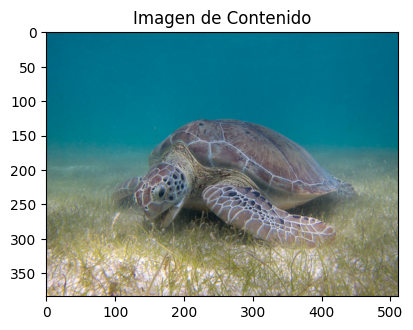

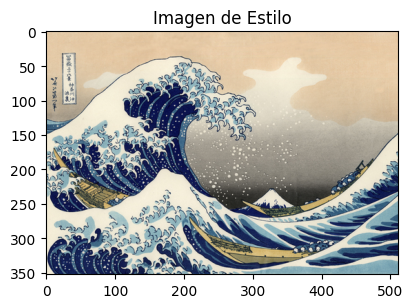

In [ ]:
# Configurar el tamaño de la figura de Matplotlib a 10x10 pulgadas
plt.figure(figsize=(10, 10))
# Cargar la imagen de contenido y la convertimos a tipo 'uint8'
content = load_img(content_path).astype('uint8')
# Cargar la imagen de estilo y la convertimos a tipo 'uint8'
style = load_img(style_path).astype('uint8')
# Mostrar la imagen de contenido en el primer subplot
plt.subplot(1, 2, 1)
imshow(content, 'Imagen de Contenido')
# Mostrar la imagen de estilo en el segundo subplot
plt.subplot(1, 2, 2)
imshow(style, 'Imagen de Estilo')
# Mostrar la figura
plt.show()


## Preparar los datos
Vamos a crear métodos que nos permitan cargar y preprocesar nuestras imágenes fácilmente. Realizamos el mismo proceso de preprocesamiento que se espera según el proceso de entrenamiento de VGG. Las redes VGG se entrenan con imágenes en las que cada canal se normaliza con mean = [103.939, 116.779, 123.68] y con canales BGR.

In [ ]:
def load_and_process_img(path_to_img):
  # Cargar la imagen desde la ruta proporcionada
  img = load_img(path_to_img)
  # Preprocesar la imagen según lo esperado por el modelo VGG19
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img


Para poder visualizar los resultados de nuestra optimización, es necesario realizar el paso inverso de preprocesamiento. Además, dado que nuestra imagen optimizada puede tomar valores en cualquier rango entre −∞ y ∞, debemos recortar los valores para mantenerlos dentro del rango de 0-255.

In [ ]:
def deprocess_img(processed_img):
  # Crear una copia de la imagen procesada
  x = processed_img.copy()
  # Si la imagen tiene una dimensión de lote, eliminar esa dimensión
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  # Asegurar que la imagen tenga tres dimensiones (altura, anchura, canales)
  assert len(x.shape) == 3, ("La entrada para desprocesar la imagen debe ser una imagen de "
  "dimensión [1, height, width, channel] o [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Entrada inválida para desprocesar la imagen")
  # Realizar el paso inverso del preprocesamiento
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  # Reordenar los canales de BGR a RGB
  x = x[:, :, ::-1]
  # Recortar los valores para mantenerlos dentro del rango 0-255
  x = np.clip(x, 0, 255).astype('uint8')
  return x

### Definir representaciones de contenido y estilo
Para obtener tanto las representaciones de contenido como de estilo de nuestra imagen, examinaremos algunas capas intermedias dentro de nuestro modelo. A medida que profundizamos en el modelo, estas capas intermedias representan características de orden cada vez más alto. En este caso, estamos utilizando la arquitectura de la red VGG19, una red de clasificación de imágenes preentrenada. Estas capas intermedias son necesarias para definir la representación de contenido y estilo de nuestras imágenes. Para una imagen de entrada, intentaremos igualar las representaciones objetivo correspondientes de estilo y contenido en estas capas intermedias.

#### ¿Por qué capas intermedias?
A grandes rasgos, este fenómeno se puede explicar por el hecho de que, para que una red realice la clasificación de imágenes (que es para lo que nuestra red ha sido entrenada), debe comprender la imagen. Esto implica tomar la imagen en bruto como píxeles de entrada y construir una representación interna a través de transformaciones que convierten los píxeles de la imagen en bruto en una comprensión compleja de las características presentes dentro de la imagen. Esta es también, en parte, la razón por la cual las redes neuronales convolucionales pueden generalizar bien: son capaces de capturar las invariancias y características definitorias dentro de las clases (por ejemplo, gatos vs. perros) que son agnósticas al ruido de fondo y otras molestias. Por lo tanto, en algún lugar entre donde se alimenta la imagen en bruto y se genera la etiqueta de clasificación, el modelo actúa como un extractor de características complejo; de este modo, al acceder a capas intermedias, podemos describir el contenido y el estilo de las imágenes de entrada.


Específicamente, extraeremos estas capas intermedias de nuestra red:

In [ ]:
# Capa de contenido de la que extraeremos nuestros mapas de características
content_layers = ['block5_conv2']
# Capas de estilo en las que estamos interesados
style_layers = [
'block1_conv1',
'block2_conv1',
'block3_conv1',
'block4_conv1',
'block5_conv1'
]
# Número de capas de contenido
num_content_layers = len(content_layers)
# Número de capas de estilo
num_style_layers = len(style_layers)

## Construir el Modelo
En este caso, cargamos [VGG19](https://keras.io/applications/#vgg19) e introducimos nuestro tensor de entrada en el modelo. Esto nos permitirá extraer los mapas de características (y posteriormente las representaciones de contenido y estilo) de las imágenes de contenido, estilo y generadas.

Usamos VGG19, como se sugiere en el artículo. Además, dado que VGG19 es un modelo relativamente simple (en comparación con ResNet, Inception, etc.), los mapas de características funcionan mejor para la transferencia de estilo.


Para acceder a las capas intermedias correspondientes a nuestros mapas de características de estilo y contenido, obtenemos las salidas correspondientes y utilizando la API Funcional de Keras [**Functional API**](https://keras.io/getting-started/functional-api-guide/), definimos nuestro modelo con las activaciones de salida deseadas..

Con la API Funcional, definir un modelo simplemente implica definir la entrada y la salida:

`model = Model(inputs, outputs)`

In [ ]:
def get_model():
  """ Crea nuestro modelo con acceso a capas intermedias.
  Esta función cargará el modelo VGG19 y accederá a las capas intermedias.
  Estas capas luego se usarán para crear un nuevo modelo que tomará una imagen de entrada
  y devolverá las salidas de estas capas intermedias del modelo VGG.
  Returns:
  Retorna un modelo de Keras que toma imágenes de entrada y devuelve las capas intermedias de estilo y contenido.
  """
  # Cargar nuestro modelo. Cargar VGG preentrenado (con datos de ImageNet)
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Obtener las capas de salida correspondientes a las capas de estilo y contenido
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  # Concatenar las salidas de estilo y contenido
  model_outputs = style_outputs + content_outputs
  # Construir el modelo
  return models.Model(vgg.input, model_outputs)



En el fragmento de código anterior, cargamos nuestra red preentrenada de clasificación de imágenes. Luego, obtenemos las capas de interés como las definimos anteriormente. Después, definimos un Modelo estableciendo las entradas del modelo como una imagen y las salidas como las salidas de las capas de estilo y contenido. En otras palabras, ¡hemos creado un modelo que tomará una imagen de entrada y devolverá las capas intermedias de estilo y contenido!

## Definir y crear la función de pérdida (distancias de contenido y estilo)

### Pérdida del contenido (content loss)

Nuestra definición de pérdida de contenido es bastante simple. Pasaremos la red tanto la imagen de contenido deseada como nuestra imagen base de entrada. Esto devolverá las salidas de capas intermedias (de las capas definidas anteriormente) de nuestro modelo. Luego simplemente tomamos la distancia euclidiana entre las dos representaciones intermedias de esas imágenes.

Más formalmente, la pérdida de contenido es una función que describe la distancia del contenido desde nuestra imagen de salida $x$ y nuestra imagen de contenido $p$. Sea $C_{nn}$ una red neuronal convolucional profunda preentrenada. En este caso, utilizamos [VGG19](https://keras.io/applications/#vgg19). Sea $X$ cualquier imagen, entonces $C_{nn}(X)$ es la red alimentada por $X$. Sea $F^l_{ij}(x) \in C_{nn}(x)$ y $P^l_{ij}(p) \in C_{nn}(p)$ que describen la representación de características intermedias respectivas de la red con entradas $x$ y $p$ en la capa $l$. Entonces describimos formalmente la distancia de contenido (pérdida) como:

$$L^l_{content}(p, x) = \sum_{i, j} (F^l_{ij}(x) - P^l_{ij}(p))^2$$

Realizamos retropropagación de la manera habitual para minimizar esta pérdida de contenido. Así cambiamos la imagen inicial hasta que genere una respuesta similar en una capa específica (definida en `content_layer`) como la imagen original de contenido.

Esto se puede implementar de manera bastante simple. Nuevamente tomará como entrada los mapas de características en una capa $L$ en una red alimentada por $x$, nuestra imagen de entrada, y $p$, nuestra imagen de contenido, y devolverá la distancia de contenido.



### Calculando la pérdida de contenido
En realidad, agregaremos nuestras pérdidas de contenido en cada capa deseada. De esta manera, en cada iteración cuando alimentamos nuestra imagen de entrada a través del modelo (lo cual en eager es simplemente model(input_image)), todas las pérdidas de contenido a través del modelo se calcularán correctamente y debido a que estamos ejecutando en modo eager, todos los gradientes se calcularán.

In [ ]:
def get_content_loss(base_content, target):
  # Calcular la diferencia al cuadrado entre las representaciones de contenido base y objetivo
  squared_difference = tf.square(base_content - target)
  # Calcular la media de las diferencias al cuadrado para obtener la pérdida de contenido
  loss = tf.reduce_mean(squared_difference)
  return loss

## Pérdida del estilo (style Loss)

Calcular la pérdida de estilo es un poco más complicado, pero sigue el mismo principio, esta vez alimentando nuestra red con la imagen de entrada base y la imagen de estilo. Sin embargo, en lugar de comparar las salidas intermedias crudas de la imagen de entrada base y la imagen de estilo, comparamos las matrices Gram de las dos salidas.

Matemáticamente, describimos la pérdida de estilo de la imagen de entrada base, $x$, y la imagen de estilo, $a$, como la distancia entre la representación de estilo (las matrices Gram) de estas imágenes. Describimos la representación de estilo de una imagen como la correlación entre diferentes respuestas de filtros dada por la matriz Gram $G^l$, donde $G^l_{ij}$ es el producto interno entre el mapa de características vectorizado $i$ y $j$ en la capa $l$. Podemos ver que $G^l_{ij}$ generado sobre el mapa de características para una imagen dada representa la correlación entre los mapas de características $i$ y $j$.

Para generar un estilo para nuestra imagen de entrada base, realizamos descenso de gradiente desde la imagen de contenido para transformarla en una imagen que coincida con la representación de estilo de la imagen original. Lo hacemos minimizando la distancia cuadrada media entre el mapa de correlación de características de la imagen de estilo y la imagen de entrada. La contribución de cada capa a la pérdida total de estilo se describe por

$$E_l = \frac{1}{4N_l^2 M_l^2} \sum_{i,j} (G^l_{ij} - A^l_{ij})^2$$

donde $G^l_{ij}$ y $A^l_{ij}$ son las respectivas representaciones de estilo en la capa $l$ de $x$ y $a$. $N_l$ describe el número de mapas de características, cada uno de tamaño $M_l = \text{alto} \times \text{ancho}$. Así, la pérdida total de estilo a través de cada capa es

$$L_{style}(a, x) = \sum_{l \in L} w_l E_l$$

donde ponderamos la contribución de la pérdida de cada capa por algún factor $w_l$. En nuestro caso, ponderamos igualmente cada capa ($w_l = \frac{1}{|L|}$).


In [ ]:
def gram_matrix(input_tensor):
  """
  Calcula la matriz Gram para un tensor dado.
  Args:
  input_tensor (tf.Tensor): Tensor de entrada que representa las características de una capa.
  Returns:
  tf.Tensor: Matriz Gram normalizada para el tensor de entrada.
  """
  # Reorganizar los canales de la imagen primero
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  # Número de elementos en el tensor reorganizado
  n = tf.shape(a)[0]
  # Calcular la matriz Gram tomando el producto interno
  gram = tf.matmul(a, a, transpose_a=True)
  # Normalizar la matriz Gram dividiendo por el número de elementos
  return gram / tf.cast(n, tf.float32)
def get_style_loss(base_style, gram_target):
  """
  Calcula la pérdida de estilo entre la representación de estilo base y la matriz Gram objetivo.
  Args:
  base_style (tf.Tensor): Representación de estilo de la imagen base.
  gram_target (tf.Tensor): Matriz Gram objetivo para la imagen de estilo.
  Returns:
  tf.Tensor: Pérdida de estilo calculada como la media de los cuadrados de las diferencias entre las matrices Gram.
  """
  # Calcular las dimensiones de la imagen base de estilo
  height, width, channels = base_style.get_shape().as_list()
  # Calcular la matriz Gram para la representación de estilo base
  gram_style = gram_matrix(base_style)
  # Calcular la pérdida de estilo como la media de los cuadrados de las diferencias entre las matrices Gram
  loss = tf.reduce_mean(tf.square(gram_style - gram_target))
  # Retornar la pérdida de estilo
  return loss

## Aplicar transferencia de estilo a nuestras imágenes


### Ejecutar Descenso de Gradiente

En este caso, utilizamos el optimizador [Adam](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam) para minimizar nuestra pérdida. Actualizamos iterativamente nuestra imagen de salida de manera que minimice nuestra pérdida: **no actualizamos los pesos asociados a nuestra red, sino que entrenamos nuestra imagen de entrada para minimizar la pérdida**. Para hacer esto, necesitamos saber cómo calculamos nuestra pérdida y gradientes.

*Nota: Aunque es recomendable utilizar L-BFGS, no se utiliza en este tutorial debido a que una motivación principal detrás de este tutorial era ilustrar las mejores prácticas con la ejecución en modo eager, y mediante el uso de Adam, podemos demostrar la funcionalidad de cinta de gradiente/autograd con bucles de entrenamiento personalizados.*


Definiremos una pequeña función auxiliar que cargará nuestras imágenes de contenido y estilo, las pasará hacia adelante a través de nuestra red, y luego devolverá las representaciones de características de contenido y estilo desde nuestro modelo.


In [ ]:
def get_feature_representations(model, content_path, style_path):
  """
  Función auxiliar para calcular nuestras representaciones de características de contenido y estilo.
  Esta función simplemente carga y preprocesa las imágenes de contenido y estilo desde sus rutas. Luego las pasa a través
  de la red para obtener las salidas de las capas intermedias.
  Args:
  model: El modelo que estamos utilizando.
  content_path: La ruta hacia la imagen de contenido.
  style_path: La ruta hacia la imagen de estilo.
  Returns:
  Retorna las características de estilo y las características de contenido.
  """
  # Cargar las imágenes
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  # Calcular las características de estilo y contenido
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  # Obtener las representaciones de características de estilo y contenido desde nuestro modelo
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features


### Calculando la pérdida y los gradientes

Aquí utilizamos [**tf.GradientTape**](https://www.tensorflow.org/programmers_guide/eager#computing_gradients) para calcular el gradiente. Esto nos permite aprovechar la diferenciación automática al rastrear las operaciones para calcular el gradiente más tarde. Registra las operaciones durante el pase hacia adelante y luego puede calcular el gradiente de nuestra función de pérdida con respecto a nuestra imagen de entrada para el pase hacia atrás.


In [ ]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """
  Esta función calculará la pérdida total.
  Args:
  model: El modelo que nos dará acceso a las capas intermedias.
  loss_weights: Los pesos de cada contribución de cada función de pérdida.
  (peso de estilo, peso de contenido y peso de variación total)
  init_image: Nuestra imagen base inicial. Esta imagen es la que actualizamos con
  nuestro proceso de optimización. Aplicamos los gradientes con respecto a la pérdida que estamos
  calculando en esta imagen.
  gram_style_features: Matrices Gram precalculadas correspondientes a las
  capas de estilo definidas de interés.
  content_features: Salidas precalculadas de las capas de contenido definidas de
  interés.
  Returns:
  Retorna la pérdida total, pérdida de estilo, pérdida de contenido y pérdida de variación total.
  """
  style_weight, content_weight = loss_weights
  # Pasamos nuestra imagen inicial a través de nuestro modelo. Esto nos dará las representaciones de contenido y estilo
  # en nuestras capas deseadas. Dado que estamos usando eager execution, ¡nuestro modelo es invocable como cualquier otra función!
  model_outputs = model(init_image)
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  style_score = 0
  content_score = 0
  # Acumulamos las pérdidas de estilo de todas las capas
  # Aquí, ponderamos igualmente cada contribución de cada capa de pérdida de estilo
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
  # Acumulamos las pérdidas de contenido de todas las capas
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer * get_content_loss(comb_content[0], target_content)
  style_score *= style_weight
  content_score *= content_weight
  # Obtenemos la pérdida total
  loss = style_score + content_score
  return loss, style_score, content_score


Luego, calcular los gradientes es sencillo:


### Bucle de optimización

In [ ]:
import IPython.display

def run_style_transfer(content_path,
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3,
                       style_weight=1e-2):

    # Cargamos el modelo VGG19 preentrenado y establecemos todas las capas como no entrenables
    model = get_model()
    for layer in model.layers:
      layer.trainable = False
    # Obtenemos las representaciones de características de estilo y contenido de las imágenes de entrada
    style_features, content_features = get_feature_representations(model, content_path, style_path)
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
    # Inicializamos la imagen de salida que optimizaremos para transferir el estilo
    init_image = load_and_process_img(content_path)
    init_image = tf.Variable(init_image, dtype=tf.float32)
    # Creamos el optimizador Adam para minimizar la pérdida
    opt = tf.optimizers.Adam(learning_rate=5, epsilon=1e-1)
    # Variables para el manejo de visualización y mejores resultados
    best_loss, best_img = float('inf'), None
    # Configuración de pesos de pérdida
    loss_weights = (style_weight, content_weight)
    cfg = {
    'model': model,
    'loss_weights': loss_weights,
    'init_image': init_image,
    'gram_style_features': gram_style_features,
    'content_features': content_features
    }
    # Configuración para visualización de imágenes intermedias
    num_rows = 2
    num_cols = 5
    display_interval = num_iterations / (num_rows * num_cols)
    start_time = time.time()
    global_start = time.time()
    # Valores para normalización y clipping de imágenes
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means
    # Lista para almacenar las imágenes generadas en cada iteración
    imgs = []
    # Ciclo de optimización
    for i in range(num_iterations):
      # Calculamos gradientes y pérdidas
      grads, all_loss = compute_grads(cfg)
      loss, style_score, content_score = all_loss
      # Aplicamos los gradientes al inicializador de imagen
      opt.apply_gradients([(grads, init_image)])
      # Clipping de la imagen para mantener los valores de píxeles en rango válido
      clipped = tf.clip_by_value(init_image, min_vals, max_vals)
      init_image.assign(clipped)
      # Tiempo de finalización de iteración
      end_time = time.time()
      # Actualizamos la mejor imagen generada si encontramos una pérdida menor
      if loss < best_loss:
        best_loss = loss
        best_img = deprocess_img(init_image.numpy())
      # Visualización de imágenes intermedias cada cierto número de iteraciones
      if i % display_interval == 0:
        start_time = time.time()
      # Convertimos la imagen de TensorFlow a numpy y la procesamos para visualización
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      # Limpiamos la salida y mostramos la imagen actual

      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      # Imprimimos métricas de pérdida y tiempo transcurrido
      print('Iteración: {}'.format(i))
      print('Pérdida total: {:.4e}, '
      'pérdida de estilo: {:.4e}, '
      'pérdida de contenido: {:.4e}, '
      'tiempo: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
    # Finalizamos la optimización, imprimimos el tiempo total y mostramos las imágenes generadas
    print('Tiempo total: {:.4f}s'.format(time.time() - global_start))
    IPython.display.clear_output(wait=True)
    plt.figure(figsize=(14, 4))
    for i, img in enumerate(imgs):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])

    return best_img, best_loss



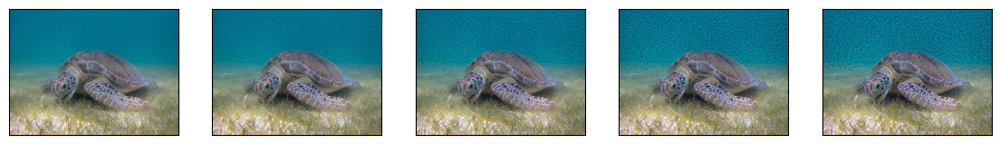

In [ ]:
# Ejecutamos el estilo de transferencia con las rutas de las imágenes de contenido y estilo, y el número de iteraciones
best_img, best_loss = run_style_transfer(content_path,style_path, num_iterations=5)
# best_img es la imagen resultante con el mejor resultado
# best_loss es la pérdida mínima obtenida durante el proceso de optimización


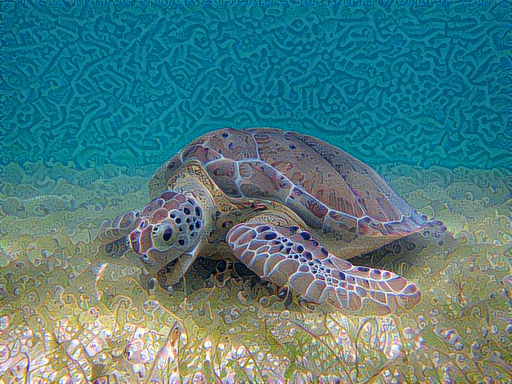

In [ ]:
# Convertimos la imagen numpy a un objeto de imagen de Pillow
Image.fromarray(best_img)


Para descargar la imagen desde Colab, descomenta el siguiente código:

In [ ]:
#from google.colab import files
#final_img = Image.fromarray(best)
#final_img.save('wave_turtle.png')
#files.download('wave_turtle.png')

##Visualizar resultados

"Desprocesamos" la imagen de salida para eliminar el procesamiento que se le aplicó.

In [ ]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  # Crear una figura con tamaño específico
  plt.figure(figsize=(10, 5))

  # Cargar y mostrar la imagen de contenido
  content = load_img(content_path)
  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  # Cargar y mostrar la imagen de estilo
  style = load_img(style_path)
  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  # Mostrar la imagen de salida procesada si se solicita
  if show_large_final:
    plt.figure(figsize=(10, 10))
    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()


<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


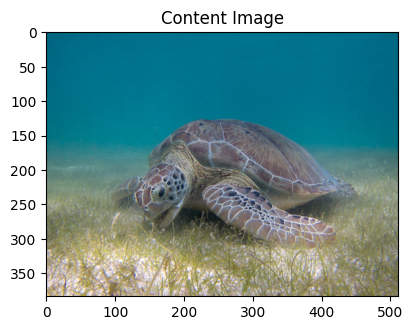

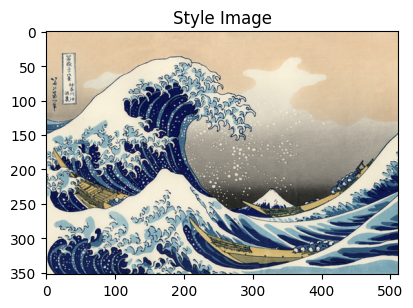

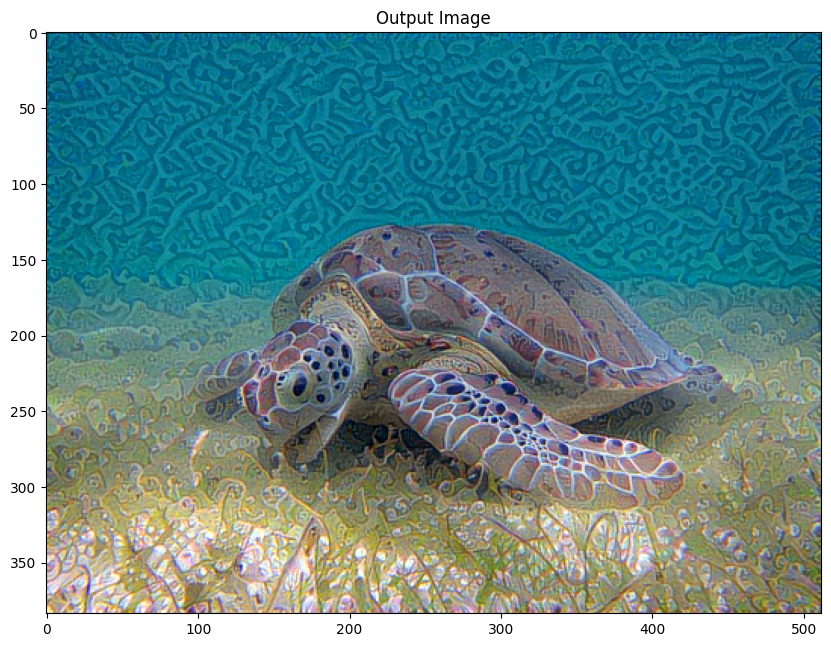

In [ ]:
# Mostrar los resultados del estilo transferido utilizando las imágenes de contenido y estilo especificadas.
show_results(best_img, content_path, style_path)


In [ ]:
def compute_grads(cfg):
  # Abrimos un GradientTape para grabar las operaciones y calcular gradientes
  with tf.GradientTape() as tape:
    # Calculamos todas las pérdidas usando la configuración proporcionada
    all_loss = compute_loss(**cfg)

  # Obtenemos la pérdida total para optimización
  total_loss = all_loss[0]

  # Calculamos los gradientes con respecto a la imagen inicial que estamos optimizando
  return tape.gradient(total_loss, cfg['init_image']), all_loss


## Intenta con otras imágenes

### Starry night + Tuebingen

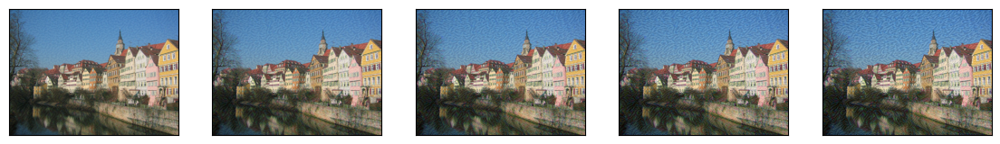

In [ ]:
best_starry_night, best_loss = run_style_transfer('/tmp/nst/Tuebingen_Neckarfront.jpg',
                                                  '/tmp/nst/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',num_iterations=5)

<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


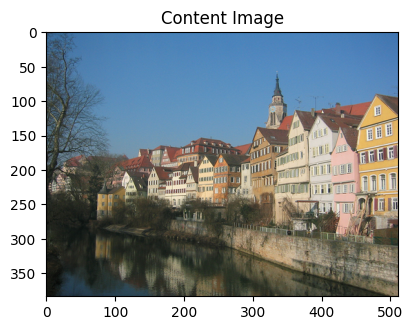

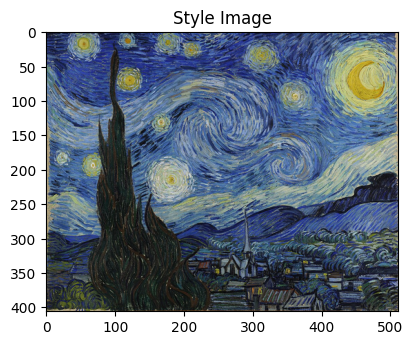

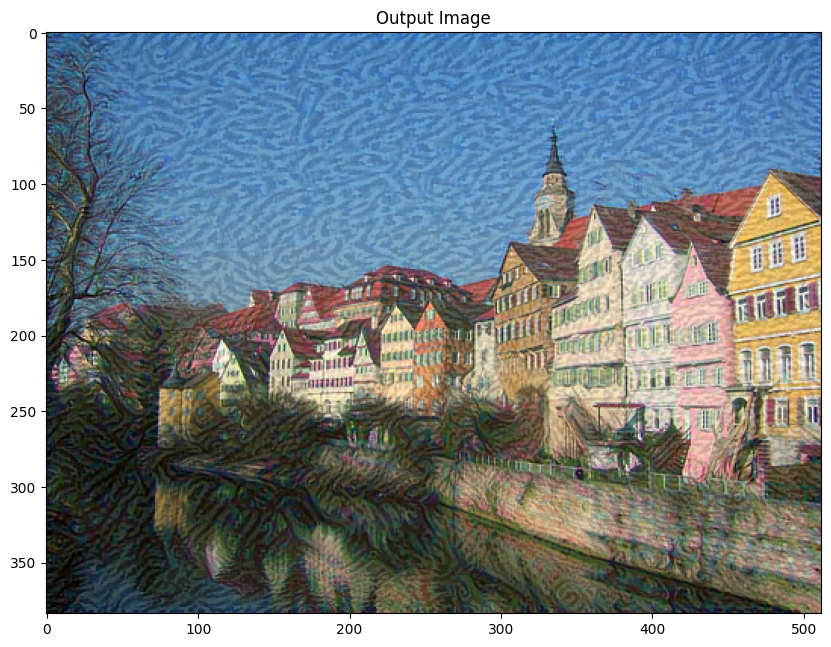

In [ ]:
show_results(best_starry_night, '/tmp/nst/Tuebingen_Neckarfront.jpg',
             '/tmp/nst/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg')

### Pillars of Creation + Tuebingen

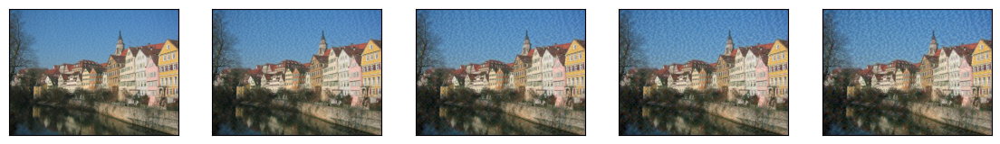

In [ ]:
best_poc_tubingen, best_loss = run_style_transfer('/tmp/nst/Tuebingen_Neckarfront.jpg',
                                                  '/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',num_iterations=5)

<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


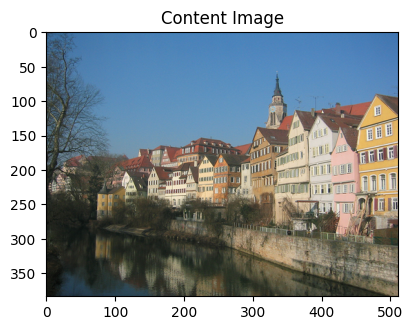

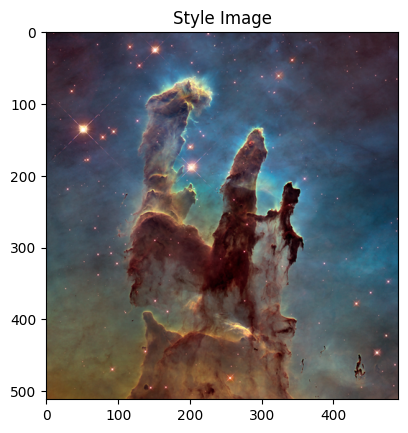

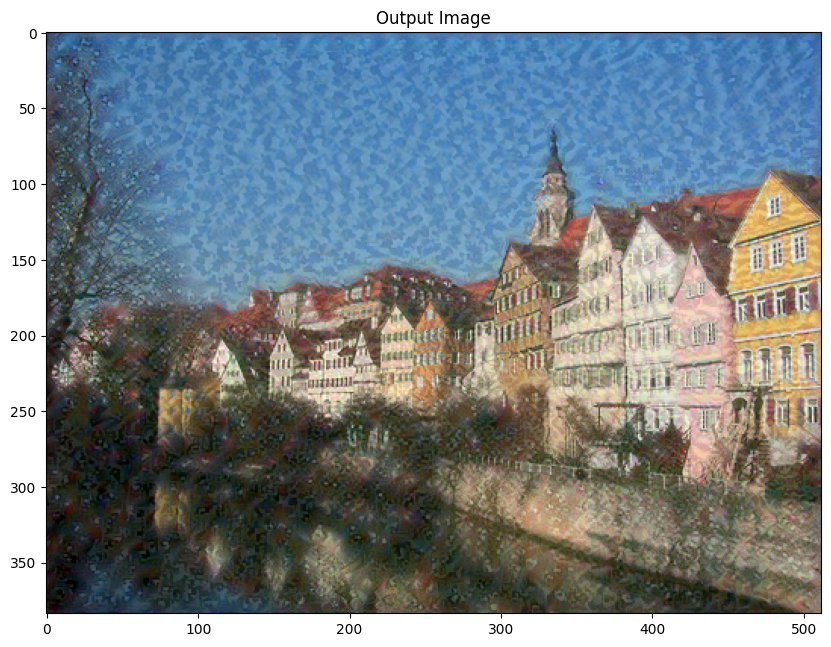

In [ ]:
show_results(best_poc_tubingen,
             '/tmp/nst/Tuebingen_Neckarfront.jpg',
             '/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg')

### Kandinsky Composition 7 + Tuebingen

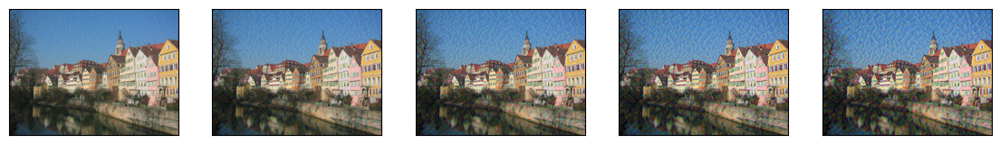

In [ ]:
best_kandinsky_tubingen, best_loss = run_style_transfer('/tmp/nst/Tuebingen_Neckarfront.jpg',
                                                  '/tmp/nst/Vassily_Kandinsky,_1913_-_Composition_7.jpg',num_iterations=5)

<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


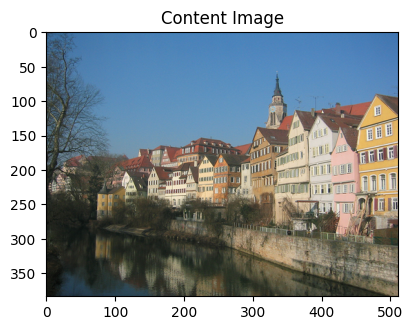

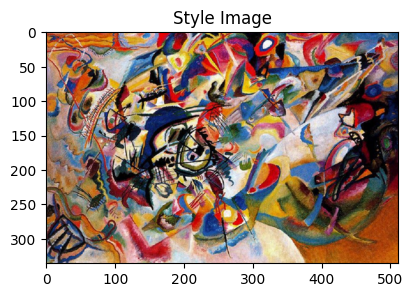

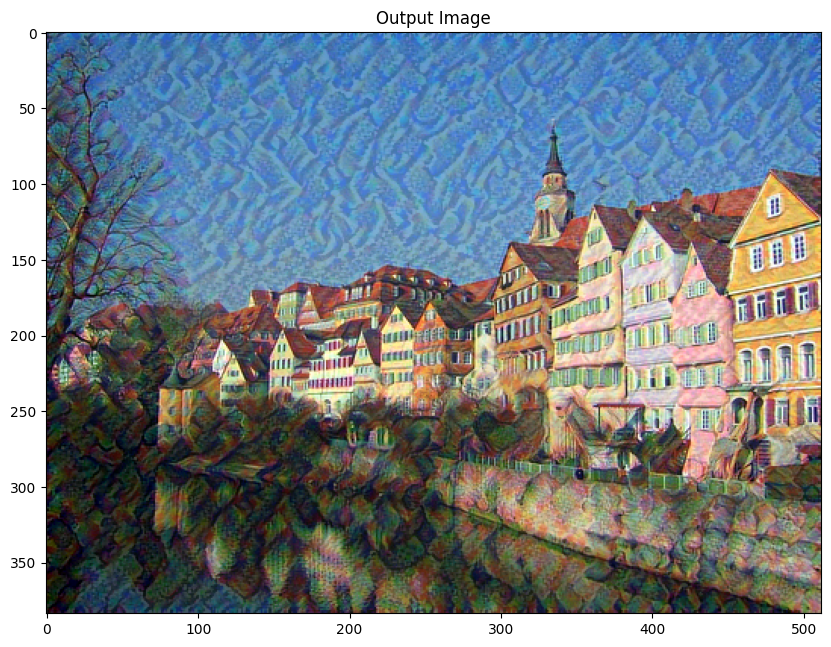

In [ ]:
show_results(best_kandinsky_tubingen,
             '/tmp/nst/Tuebingen_Neckarfront.jpg',
             '/tmp/nst/Vassily_Kandinsky,_1913_-_Composition_7.jpg')

### Pillars of Creation + Sea Turtle

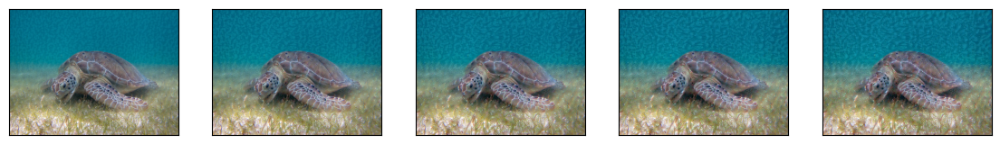

In [ ]:
best_poc_turtle, best_loss = run_style_transfer('/tmp/nst/Green_Sea_Turtle_grazing_seagrass.jpg',
                                                  '/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',num_iterations=5)

<ipython-input-39-b8f023c7098e>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)


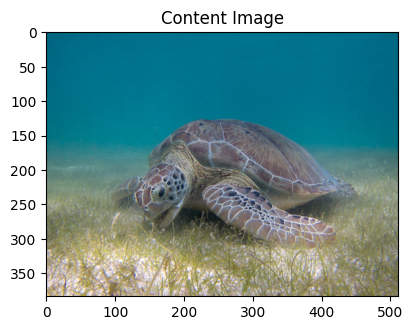

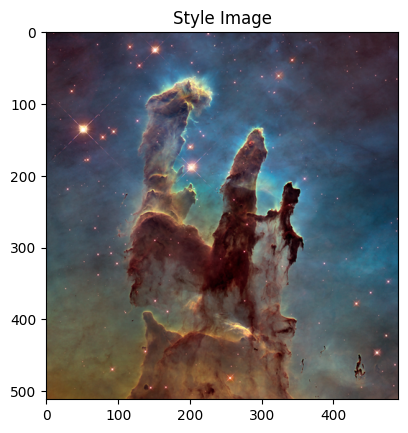

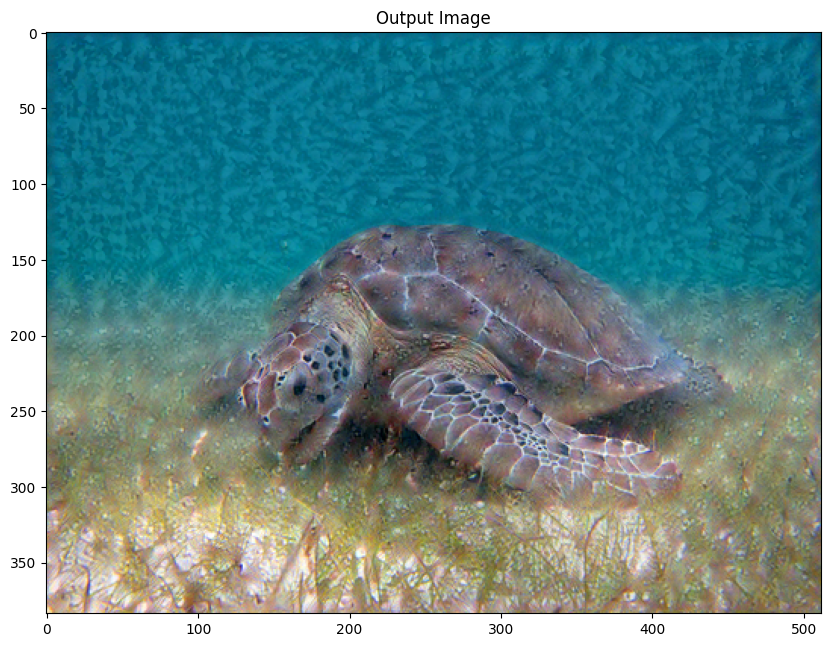

In [ ]:
show_results(best_poc_turtle,
             '/tmp/nst/Green_Sea_Turtle_grazing_seagrass.jpg',
             '/tmp/nst/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg')